In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot')
import pandas as pd

#import lsst.ip.diffim as ipDiffim
# I linked from ip_diffim/python/lsst/ip/diffim/imageMapReduce.py into diffimTests/imageMapReduce.py
#    (or copy it)

In [2]:
import diffimTests as dit
#reload(dit)

testObj = dit.DiffimTest(varFlux2=np.repeat(5000, 10), 
                         #varFlux2=np.repeat(620*np.sqrt(2), 20),
                         n_sources=600, verbose=True, sourceFluxRange=(2000., 120000.), 
                         variablesAvoidBorder=3.5, psf_yvary_factor=0.5, psfSize=13)
res = testObj.runTest(spatialKernelOrder=2)
print res

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
PSF y spatial-variation: -0.492813481453 0.493450410102
Variable source: 9 368.142255845 52.2977464926 0 5000
Variable source: 3 437.677528631 394.051374239 0 5000
Variable source: 7 77.2355874401 392.237254371 0 5000
Variable source: 10 66.5809759253 363.20308398 0 5000
Variable source: 6 352.24315562 433.633351478 0 5000
Variable source: 1 237.897633976 429.430670374 0 5000
Variable source: 11 89.7121431268 243.982084998 0 5000
Variable source: 2 260.515557753 389.705213876 0 5000
Variable source: 8 184.879430277 305.582257912 0 5000
Variable source: 0 300.731568916 220.088731954 0 5000
{'Zogy': {'FP': 35, 'FN': 0, 'TP': 10}, 'ALstack': {'FP': 4, 'FN': 0, 'TP': 10}, 'SZogy': {'FP': 27, 'FN': 0, 'TP': 10}, 'ALstack_decorr': {'FP': 0, 'FN': 0, 'TP': 10}}


In [3]:
import lsst.afw.geom as afwGeom

exposure = testObj.im2.asAfwExposure()
template = testObj.im1.asAfwExposure()

exposure.setPsf(testObj.variablePsf.getCoaddPsf(exposure))
exposure.getPsf().computeKernelImage(afwGeom.Point2D(28., 66.)).getDimensions()

Extent2I(27, 25)

A&L(dec): stats(mean=0.048669878, stdev=24.777613, min=-222.48575, max=343.2709)
Zogy: stats(mean=-0.04197168, stdev=24.977856, min=-926.54474, max=898.99878)
A&L(dec) - Zogy: stats(mean=-0.041019283, stdev=2.7047882, min=-850.97864, max=900.02673)
A&L(dec) - A&L: stats(mean=-0.032259423, stdev=6.9194584, min=-58.314667, max=57.100113)
Scorr: stats(mean=2.5644283e-06, stdev=0.00026812186, min=-0.0175256, max=0.014269766)
Scorr_var: stats(mean=0.00025204156, stdev=1.4944854e-06, min=0.00024662129, max=0.0010555496)


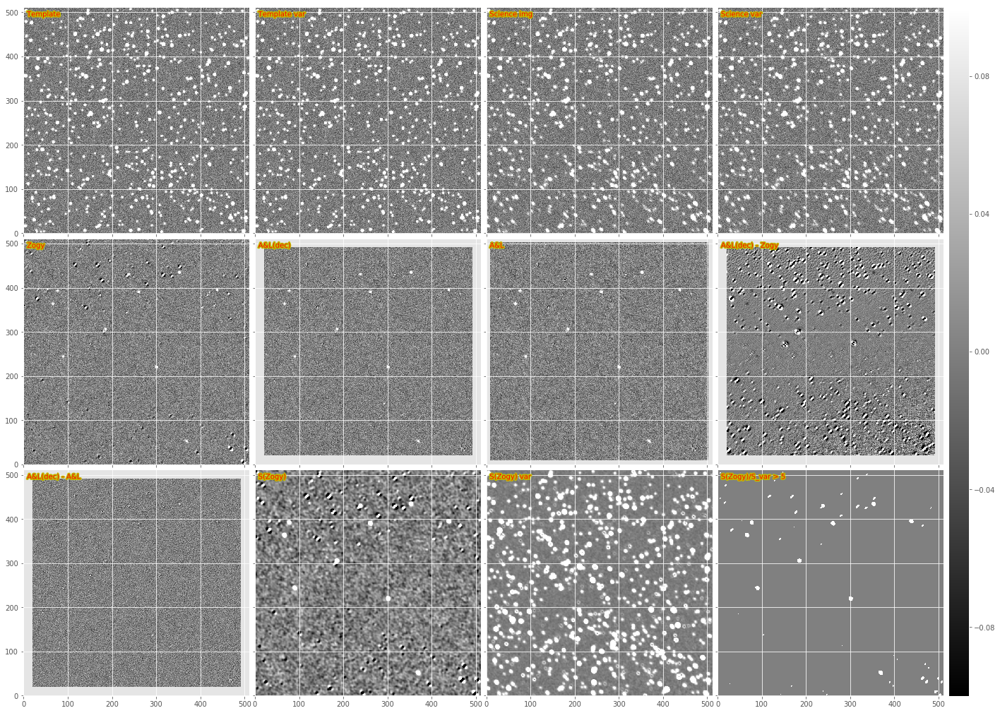

In [4]:
#dit.plotImageGrid((testObj.im1.im, testObj.im2.im), imScale=8)
testObj.doPlot(imScale=6, include_Szogy=True);

In [5]:
import lsst.pex.config as pexConfig
import lsst.afw.image as afwImage
import lsst.afw.geom as afwGeom
import lsst.afw.math as afwMath
import lsst.meas.algorithms as measAlg
import lsst.pipe.base as pipeBase
import lsst.ip.diffim as ipDiffim

In [6]:
config = dit.DecorrelateALKernelMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [7]:
def ga(exposure):
    return exposure.getMaskedImage().getImage().getArray()
def gv(exposure):
    return exposure.getMaskedImage().getVariance().getArray()

In [8]:
#import testPsfexPsfEDITED as tpp
#reload(tpp)

exposure2 = testObj.im2.asAfwExposure()
#res = dit.tasks.doMeasurePsf(exposure2) #, psfMeasureConfig=config)
#psf = res.psf
obj = dit.tasks.PsfMeasurement(exposure2)
obj.run()
psf = obj.exposure.getPsf()
exposure2.setPsf(psf)

template2 = testObj.im1.asAfwExposure()
#res = dit.tasks.doMeasurePsf(template2) #, psfMeasureConfig=config)
#psf = res.psf
obj = dit.tasks.PsfMeasurement(template2)
obj.run()
psf = obj.exposure.getPsf()
template2.setPsf(psf)

538
540


In [9]:
ALres = dit.tasks.doAlInStack(template2, exposure2, doWarping=False, doDecorr=True, doPreConv=False,
            spatialBackgroundOrder=0, spatialKernelOrder=2)

In [10]:
newExpC = task.run(ALres.subtractedExposure, template=template2, science=exposure2,
                  alTaskResult=ALres, forceEvenSized=True).exposure

Grid parameters: 46 46 41.8671875 41.8671875 14 14


diffimTests/imageMapReduce.py:281: RuntimeWarning: invalid value encountered in true_divide
  newMI.getImage().getArray()[:, :] /= wts
diffimTests/imageMapReduce.py:282: RuntimeWarning: invalid value encountered in true_divide
  newMI.getVariance().getArray()[:, :] /= wts


In [11]:
testObj2 = testObj.clone()
testObj2.ALres.decorrelatedDiffim = newExpC
testObj2.runTest(spatialKernelOrder=2)

{'ALstack': {'FN': 0, 'FP': 4, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 27, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 35, 'TP': 10}}

Finally, let's compare it to spatially-varying ZOGY!

NOTE that the `gridStep/gridSize` combo doesn't seem to correctly fully cover the entire image in all cases! In this case (the default), it does, but if I uncomment the 'gridStep' setting line below, it doesn't.

In [12]:
config = dit.ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
#config.gridSizeX = config.gridSizeY = 10
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [13]:
newExpZ = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=False, forceEvenSized=True).exposure
newExpZ_Scorr = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=True, forceEvenSized=True).exposure

Grid parameters: 46 46 37.31640625 37.31640625 14 14


In [14]:
testObj3 = testObj.clone()
testObj3.ALres.decorrelatedDiffim = newExpC
testObj3.D_Zogy = newExpZ
testObj3.S_Zogy = newExpZ_Scorr
testObj3.runTest(spatialKernelOrder=2)

{'ALstack': {'FN': 0, 'FP': 4, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 8, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 8, 'TP': 10}}

A&L(dec): stats(mean=0.051389128, stdev=24.659901, min=-219.71259, max=333.62769)
Zogy: stats(mean=-0.002704462, stdev=24.815586, min=-544.5932, max=371.44653)
A&L(dec) - Zogy: stats(mean=0.034856863, stdev=28.016615, min=-386.1131, max=148.07912)
A&L(dec) - A&L: stats(mean=-0.034124974, stdev=6.8241639, min=-56.202927, max=48.564468)
Scorr: stats(mean=-4.1977082e-06, stdev=0.00025748095, min=-0.0039176107, max=0.014871636)
Scorr_var: stats(mean=0.00024820419, stdev=1.673115e-05, min=0.00021536756, max=0.0009002561)


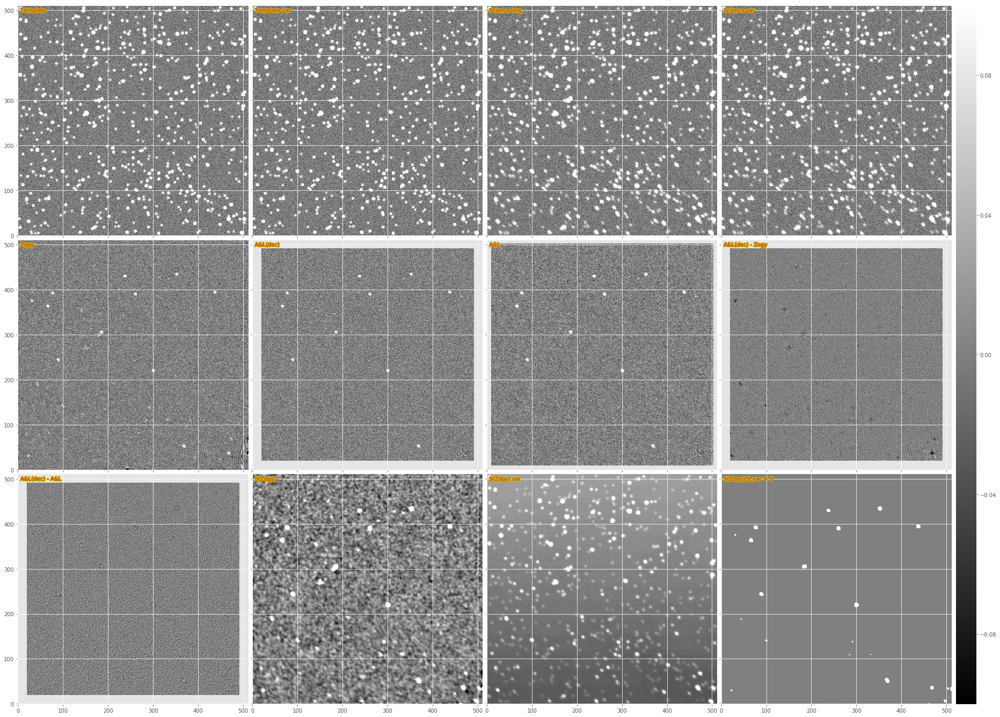

In [15]:
testObj3.doPlot(imScale=8, include_Szogy=True); #, centroidCoord=[424,66]);

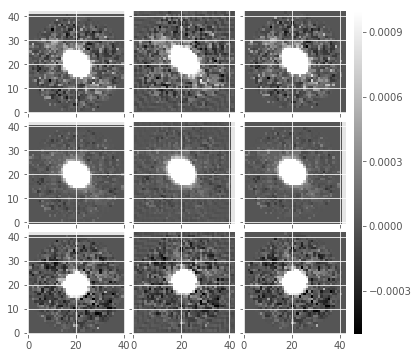

In [16]:
def gp(exp, coord):
    return exp.getPsf().computeImage(afwGeom.Point2D(coord[0], coord[1])).getArray()
    
dit.plotImageGrid((gp(exposure2, [80,80]), gp(newExpC, [80,80]), gp(newExpZ, [80,80]),
                   gp(exposure2, [255,255]), gp(newExpC, [255,255]), gp(newExpZ, [255,255]),
                   gp(exposure2, [480,480]), gp(newExpC, [480,480]), gp(newExpZ, [480,480]),), 
                  clim=(-0.0005, 0.001), nrows_ncols=(3, 3))

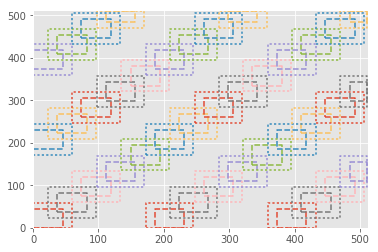

In [17]:
task.plotBoxes(exposure2.getBBox(), skip=5)

`inImageSpace = True`

Need to increase the border size

Definitely takes a while!

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 4.0, 'borderSizeY': 4.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}
Grid parameters: 46 46 37.31640625 37.31640625 18 18


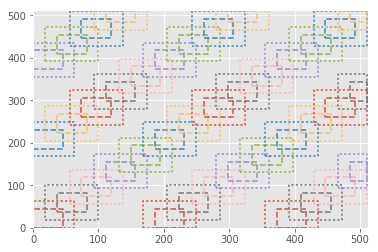

In [18]:
config = dit.ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
#config.gridSizeX = config.gridSizeY = 15
config.borderSizeX = config.borderSizeY = 4
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

task._generateGrid(exposure2, forceEvenSized=True)
task.plotBoxes(exposure2.getBBox(), skip=5)

In [19]:
newExpZIS = task.run(exposure2, template=template2, inImageSpace=True,
                       Scorr=False, forceEvenSized=True).exposure
#newExpZIS_Scorr = task.run(exposure2, template=template2, inImageSpace=True,
#                       Scorr=True, forceEvenSized=True).exposure

In [20]:
testObj3IS = testObj.clone()
testObj3IS.ALres.decorrelatedDiffim = newExpC
testObj3IS.D_Zogy = newExpZIS  #dit.Exposure(ga(newExpZ), testObj.D_Zogy.psf, gv(newExpZ))
#testObj3IS.S_Zogy = newExpZIS_Scorr  #dit.Exposure(ga(newExpZ_Scorr), dit.psf.afwPsfToArray(newExpZ_Scorr.getPsf()), gv(newExpZ_Scorr))
testObj3IS.runTest(spatialKernelOrder=2)

{'ALstack': {'FN': 0, 'FP': 4, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 27, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 24, 'TP': 10}}

stats(mean=-0.10605178, stdev=6.2831388, min=-174.08324, max=216.45297)


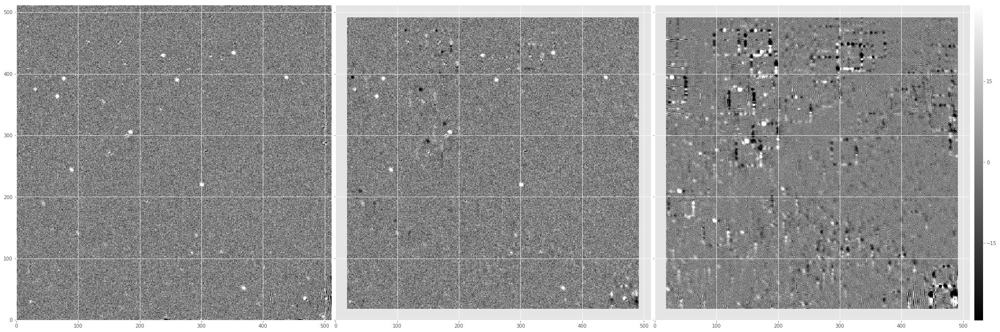

In [21]:
print dit.computeClippedImageStats(ga(newExpZ)-ga(newExpZIS))
dit.plotImageGrid((ga(newExpZ), ga(newExpZIS), ga(newExpZ)-ga(newExpZIS)), imScale=12)

In [57]:
import lsst.pex.config as pexConfig
import lsst.afw.image as afwImage
import lsst.afw.geom as afwGeom
import lsst.pipe.base as pipeBase

class ZogyMapperSubtask(dit.ImageMapperSubtask):
    ConfigClass = dit.ImageMapperSubtaskConfig
    _DefaultName = 'diffimTests_ZogyMapperSubtask'
    
    def __init__(self, *args, **kwargs):
        dit.ImageMapperSubtask.__init__(self, *args, **kwargs)
        
    def run(self, subExp, expandedSubExp, fullBBox, **kwargs):
        bbox = subExp.getBBox()
        center = ((bbox.getBeginX() + bbox.getEndX()) // 2., (bbox.getBeginY() + bbox.getEndY()) // 2.)
        center = afwGeom.Point2D(center[0], center[1])
        
        template = kwargs.get('template')
        science = kwargs.get('science')
        inImageSpace = kwargs.get('inImageSpace', False)
        variablePsf2 = kwargs.get('variablePsf', None)
        sigmas = kwargs.get('sigmas', None)
                
        # Psf and image for science img (index 2)
        subExp2 = science.Factory(science, expandedSubExp.getBBox())
        if variablePsf2 is None:
            psf2 = science.getPsf().computeImage(center).getArray()
        else:
            psf2 = variablePsf2.getImage(center.getX(), center.getY())
        subim2 = expandedSubExp.getMaskedImage()
        subarr2 = subim2.getImage().getArray()
        subvar2 = subim2.getVariance().getArray()
        if sigmas is None:
            sig2 = np.sqrt(dit.computeClippedImageStats(subvar2).mean)
        else:
            sig2 = sigmas[1]  # for testing, can use the input sigma (global value for entire exposure)
        
        # Psf and image for template img (index 1)
        subExp1 = template.Factory(template, expandedSubExp.getBBox())
        psf1 = template.getPsf().computeImage(center).getArray()
        subim1 = subExp1.getMaskedImage()
        subarr1 = subim1.getImage().getArray()
        subvar1 = subim1.getVariance().getArray()
        if sigmas is None:
            sig1 = np.sqrt(dit.computeClippedImageStats(subvar1).mean)
        else:
            sig1 = sigmas[0]

        #shape2 = subExp2.getPsf().computeShape(center)
        #shape1 = subExp1.getPsf().computeShape(center)
        #print shape2, shape1
        
        psf1b = psf1; psf2b = psf2
        if psf1.shape[0] == 41:   # it's a measured psf (hack!) Note this really helps for measured psfs.
            psf1b = psf1.copy()
            psf1b[psf1b < 0] = 0
            #psf1b[0:10,0:10] = psf1b[31:41,31:41] = 0
            psf1b[0:10,:] = psf1b[:,0:10] = psf1b[31:41,:] = psf1b[:,31:41] = 0
            psf1b /= psf1b.sum()

            psf2b = psf2.copy()
            psf2b[psf2b < 0] = 0
            psf2b[0:10,:] = psf2b[:,0:10] = psf2b[31:41,:] = psf2b[:,31:41] = 0
            psf2b /= psf2b.sum()

        # from diffimTests.diffimTests ...
        if subarr1.shape[0] < psf1.shape[0] or subarr1.shape[1] < psf1.shape[1]:
            return pipeBase.Struct(subExposure=subExp)

        D_zogy, var_zogy = None, None
        if not inImageSpace:
            padSize0 = subarr1.shape[0]//2 - psf1.shape[0]//2
            padSize1 = subarr1.shape[1]//2 - psf1.shape[1]//2
            # Hastily assume the image is even-sized and the psf is odd... and that the two images
            #   and psfs have the same dimensions!
            psf1 = np.pad(psf1b, ((padSize0, padSize0-1), (padSize1, padSize1-1)), mode='constant',
                          constant_values=0)
            psf2 = np.pad(psf2b, ((padSize0, padSize0-1), (padSize1, padSize1-1)), mode='constant',
                          constant_values=0)
            if psf1.shape[0] > subarr1.shape[0]:
                psf1 = psf1[:-1, :]
                psf2 = psf2[:-1, :]
            elif psf1.shape[0] < subarr1.shape[0]:
                psf1 = np.pad(psf1, ((0, 1), (0, 0)), mode='constant', constant_values=0)
                psf2 = np.pad(psf2, ((0, 1), (0, 0)), mode='constant', constant_values=0)
            if psf1.shape[1] > subarr1.shape[1]:
                psf1 = psf1[:, :-1]
                psf2 = psf2[:, :-1]
            elif psf1.shape[1] < subarr1.shape[1]:
                psf1 = np.pad(psf1, ((0, 0), (0, 1)), mode='constant', constant_values=0)
                psf2 = np.pad(psf2, ((0, 0), (0, 1)), mode='constant', constant_values=0)
            #psf1 = dit.psf.recenterPsf(psf1)
            #psf2 = dit.psf.recenterPsf(psf2)
            psf1 /= psf1.sum()
            psf2 /= psf2.sum()

            #shape2 = dit.arrayToAfwPsf(psf2).computeShape(afwGeom.Point2D(center[0], center[1]))
            #shape1 = dit.arrayToAfwPsf(psf1).computeShape(afwGeom.Point2D(center[0], center[1]))
            #print center, shape2, shape1

            D_zogy, var_zogy = dit.zogy.computeZogyFourierSpace(subarr1, subarr2, 
                                  subvar1, subvar2, psf1, psf2, 
                                  sig1=sig1, sig2=sig2)
        else:
            D_zogy, var_zogy = dit.zogy.computeZogyImageSpace(subarr1, subarr2,
                                   subvar1, subvar2, psf1, psf2, 
                                   sig1=sig1, sig2=sig2, padSize=7)
            #print 'HERE:', subExp.getBBox(), np.sum(~np.isnan(D_zogy)), np.sum(~np.isnan(var_zogy))

        tmpExp = expandedSubExp.clone()
        tmpIM = tmpExp.getMaskedImage()
        tmpIM.getImage().getArray()[:, :] = D_zogy
        tmpIM.getVariance().getArray()[:, :] = var_zogy
        # need to eventually compute diffim PSF and set it here.
        out = tmpExp.Factory(tmpExp, subExp.getBBox())
                
        #print template
        #img += 10.
        #return out #, psf1_orig, psf2_orig
        return pipeBase.Struct(subExposure=out)

class ZogyMapReduceConfig(dit.ImageMapReduceConfig):
    mapperSubtask = pexConfig.ConfigurableField(
        doc='Zogy subtask to run on each sub-image',
        target=ZogyMapperSubtask
    )

In [58]:
config = ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
#config.gridSizeX = config.gridSizeY = 15
config.borderSizeX = config.borderSizeY = 4
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 4.0, 'borderSizeY': 4.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [59]:
def sp(exp, coord):
    return exp.getPsf().computeShape(afwGeom.Point2D(coord[0], coord[1])).getDeterminantRadius()

print sp(exposure2, [80,80])
print sp(exposure2, [255,255])
print sp(exposure2, [480,480])

2.14427035532
1.9823913318
1.81941710821


In [60]:
newExpZIS2 = task.run(exposure2, science=exposure2, template=template2, inImageSpace=True,
                       Scorr=False, forceEvenSized=True).exposure
#newExpZIS2_Scorr = task.run(exposure2, template=template2, inImageSpace=True,
#                       Scorr=True, forceEvenSized=True).exposure

Grid parameters: 46 46 37.31640625 37.31640625 18 18
(ixx=5.26614190617, iyy=5.24023320858, ixy=-2.04778689758) (ixx=2.56842989165, iyy=2.54963220918, ixy=-0.0106525145675)
(ixx=5.02223654035, iyy=4.99380896631, ixy=-1.79829895089) (ixx=2.5681178687, iyy=2.5513968601, ixy=-0.00994201340127)
(ixx=4.79325260221, iyy=4.76259843168, ixy=-1.5640413531) (ixx=2.56780552155, iyy=2.55316318293, ixy=-0.00922948938139)
(ixx=4.5791338773, iyy=4.54729316004, ixy=-1.34536549674) (ixx=2.56749285494, iyy=2.55493079398, ixy=-0.00851518612089)
(ixx=4.37712061688, iyy=4.34406484874, ixy=-1.13855446411) (ixx=2.56717268131, iyy=2.55674710977, ixy=-0.00777953266977)
(ixx=4.19656387194, iyy=4.16256265886, ixy=-0.953584545607) (ixx=2.56686018, iyy=2.55851659692, ixy=-0.00706127080121)
(ixx=4.03209033114, iyy=3.99723096691, ixy=-0.784882899154) (ixx=2.56654775952, iyy=2.56028776609, ixy=-0.00634111489764)
(ixx=3.87917522327, iyy=3.84373168845, ixy=-0.627896865522) (ixx=2.5662270927, iyy=2.56210748543, ixy=-0.0

In [61]:
testObj3IS2 = testObj.clone()
testObj3IS2.ALres.decorrelatedDiffim = newExpC
testObj3IS2.D_Zogy = newExpZIS2  #dit.Exposure(ga(newExpZ), testObj.D_Zogy.psf, gv(newExpZ))
#testObj3IS.S_Zogy = newExpZIS_Scorr  #dit.Exposure(ga(newExpZ_Scorr), dit.psf.afwPsfToArray(newExpZ_Scorr.getPsf()), gv(newExpZ_Scorr))
testObj3IS2.runTest(spatialKernelOrder=2)

{'ALstack': {'FN': 0, 'FP': 4, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 27, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 24, 'TP': 10}}

stats(mean=-0.10605178, stdev=6.2831388, min=-174.08324, max=216.45297)


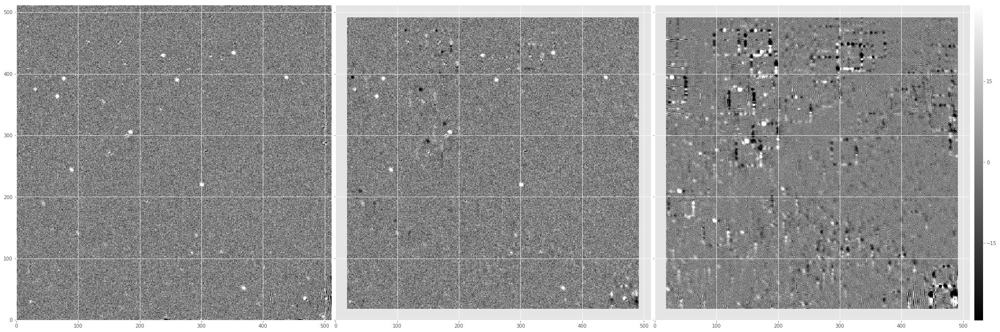

In [62]:
print dit.computeClippedImageStats(ga(newExpZ)-ga(newExpZIS2))
dit.plotImageGrid((ga(newExpZ), ga(newExpZIS2), ga(newExpZ)-ga(newExpZIS2)), imScale=12)